In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/allegro/
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/allegro
test_dataset.json  train_dataset.json  val_dataset.json


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os


In [ ]:
train = pd.read_json('train_dataset.json', orient='columns')
test = pd.read_json('test_dataset.json', orient='columns')
val = pd.read_json('val_dataset.json', orient='columns')

df = pd.concat([train, test, val], axis=0)
df

,graphic card type,communications,resolution (px),CPU cores,RAM size,operating system,drive type,input devices,multimedia,RAM type,CPU clock speed (GHz),CPU model,state,drive memory size (GB),warranty,screen size,buynow_price
7233,dedicated graphics,"[bluetooth, lan 10/100/1000 mbps]",1920 x 1080,4,32 gb,[no system],ssd + hdd,"[keyboard, touchpad, illuminated keyboard, num...","[SD card reader, camera, speakers, microphone]",ddr4,2.6,intel core i7,new,1250.0,producer warranty,"17"" - 17.9""",4999.0
5845,dedicated graphics,"[wi-fi, bluetooth, lan 10/100 mbps]",1366 x 768,4,8 gb,[windows 10 home],ssd,"[keyboard, touchpad, numeric keyboard]","[SD card reader, camera, speakers, microphone]",ddr3,2.4,intel core i7,new,256.0,seller warranty,"15"" - 15.9""",2649.0
10303,None,"[bluetooth, nfc (near field communication)]",1920 x 1080,2,8 gb,[windows 10 home],hdd,None,[SD card reader],ddr4,1.6,intel core i7,new,1000.0,producer warranty,"15"" - 15.9""",3399.0
10423,None,None,None,2,None,None,None,None,None,None,NaN,None,new,NaN,producer warranty,None,1599.0
5897,integrated graphics,"[wi-fi, bluetooth]",2560 x 1440,4,8 gb,[windows 10 home],ssd,"[keyboard, touchpad, illuminated keyboard]","[SD card reader, camera, speakers, microphone]",ddr4,1.2,other CPU,new,256.0,producer warranty,"12"" - 12.9""",4499.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4433,dedicated graphics,"[bluetooth, lan 10/100/1000 mbps, lan 10/100 m...",3840 x 2160,4,16 gb,[no system],ssd + hdd,"[keyboard, touchpad]","[camera, speakers, microphone]",ddr4,2.8,intel core i7,new,1256.0,producer warranty,"15"" - 15.9""",7936.0
9242,None,None,None,6,None,None,None,None,None,None,NaN,None,new,NaN,seller warranty,None,2890.0
3982,dedicated graphics,"[bluetooth, lan 10/100 mbps]",1920 x 1080,2,4 gb,[no system],ssd,"[keyboard, touchpad]","[SD card reader, camera, speakers, microphone]",ddr4,2.0,intel core i3,new,240.0,producer warranty,"15"" - 15.9""",2716.0
9673,dedicated graphics,"[bluetooth, lan 10/100/1000 mbps, lan 10/100 m...",1920 x 1080,4,16 gb,[windows 10 home],ssd,"[keyboard, touchpad, illuminated keyboard]","[SD card reader, camera, speakers, microphone]",ddr4,2.5,intel core i5,new,480.0,producer warranty,"15"" - 15.9""",4319.0


In [ ]:
df.isna().sum()

,0
graphic card type,496
communications,782
resolution (px),608
CPU cores,0
RAM size,450
operating system,650
drive type,435
input devices,678
multimedia,708
RAM type,864


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7853 entries, 7233 to 4277
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   graphic card type       7357 non-null   object 
 1   communications          7071 non-null   object 
 2   resolution (px)         7245 non-null   object 
 3   CPU cores               7853 non-null   object 
 4   RAM size                7403 non-null   object 
 5   operating system        7203 non-null   object 
 6   drive type              7418 non-null   object 
 7   input devices           7175 non-null   object 
 8   multimedia              7145 non-null   object 
 9   RAM type                6989 non-null   object 
 10  CPU clock speed (GHz)   6917 non-null   float64
 11  CPU model               7320 non-null   object 
 12  state                   7853 non-null   object 
 13  drive memory size (GB)  7372 non-null   float64
 14  warranty                7853 non-null   ob

In [ ]:
df.describe()

,CPU clock speed (GHz),drive memory size (GB),buynow_price
count,6917.00000,7372.000000,7853.000000
mean,2.33743,653.239826,3475.527050
std,0.39109,477.616013,1730.904165
min,0.00000,0.000000,429.000000
25%,2.00000,256.000000,2199.000000
50%,2.50000,500.000000,3149.000000
75%,2.60000,1000.000000,4399.000000
max,3.90000,10000.000000,15472.650000


In [ ]:
# Identify columns with lists
list_columns = [col for col in df.columns if df[col].apply(lambda x: isinstance(x, list)).any()]

# Convert lists to tuples
for col in list_columns:
    df[col] = df[col].apply(lambda x: tuple(x) if isinstance(x, list) else x) # Check if the value is a list before converting to a tuple

# Now you should be able to calculate nunique values
df.nunique()


,0
graphic card type,2
communications,112
resolution (px),13
CPU cores,7
RAM size,11
operating system,25
drive type,5
input devices,12
multimedia,15
RAM type,3


In [ ]:
# Look at unique values of each column, except the ones formatted as list
for col in df.columns.to_list():
    if type(df[col][0]) != list:
        print(f"unique values of {col} are: ", df[col].unique())
        print("-----------------------------------------------------")

unique values of graphic card type are:  ['dedicated graphics' None 'integrated graphics']
-----------------------------------------------------
unique values of communications are:  [('bluetooth', 'lan 10/100/1000 mbps')
 ('wi-fi', 'bluetooth', 'lan 10/100 mbps')
 ('bluetooth', 'nfc (near field communication)') None
 ('wi-fi', 'bluetooth') ('wi-fi', 'bluetooth', 'lan 10/100/1000 mbps')
 ('nfc (near field communication)', 'gps')
 ('wi-fi 802.11 b/g/n/ac', 'bluetooth', 'lan 10/100/1000 mbps')
 ('bluetooth', 'lan 10/100 mbps')
 ('bluetooth', 'lan 10/100/1000 mbps', 'lan 10/100 mbps', 'intel wireless display (widi)', 'nfc (near field communication)', 'modem 3g (wwan)')
 ('wi-fi 802.11 b/g/n/ac', 'bluetooth', 'lan 10/100 mbps') ('bluetooth',)
 ('bluetooth', 'lan 10/100/1000 mbps', 'intel wireless display (widi)')
 ('lan 10/100 mbps', 'nfc (near field communication)', 'gps')
 ('nfc (near field communication)',)
 ('bluetooth', 'lan 10/100/1000 mbps', 'lan 10/100 mbps', 'intel wireless displa

In [ ]:
df = df.drop('state', axis =1)
df = df.dropna()


In [ ]:
def ram_size_conversion(ram_size):
  if ram_size is not None:
    ram_size = ram_size.replace(' gb', '')
    if 'mb' in ram_size:
      ram_size = str(float(ram_size.replace(' mb', '')) / 1000)
  return ram_size

df['RAM size'] = df['RAM size'].apply(ram_size_conversion)


In [ ]:
df['screen size'] = df['screen size'].apply(lambda x: int(str(x)[:2]) if str(x)[:2].isdigit() else None)


In [ ]:
def split_resolution(resolution):

  if resolution is not None:
    try:
      x, y = resolution.lower().split(' x ')
      return int(x), int(y)
    except:
      return None, None
  else:
    return None, None

df['x_resolution'], df['y_resolution'] = zip(*df['resolution (px)'].apply(split_resolution))
df = df.drop('resolution (px)', axis =1)


In [ ]:
df

,graphic card type,communications,CPU cores,RAM size,operating system,drive type,input devices,multimedia,RAM type,CPU clock speed (GHz),CPU model,drive memory size (GB),warranty,screen size,buynow_price,x_resolution,y_resolution
7233,dedicated graphics,"(bluetooth, lan 10/100/1000 mbps)",4,32,"(no system,)",ssd + hdd,"(keyboard, touchpad, illuminated keyboard, num...","(SD card reader, camera, speakers, microphone)",ddr4,2.6,intel core i7,1250.0,producer warranty,17,4999.0,1920,1080
5845,dedicated graphics,"(wi-fi, bluetooth, lan 10/100 mbps)",4,8,"(windows 10 home,)",ssd,"(keyboard, touchpad, numeric keyboard)","(SD card reader, camera, speakers, microphone)",ddr3,2.4,intel core i7,256.0,seller warranty,15,2649.0,1366,768
5897,integrated graphics,"(wi-fi, bluetooth)",4,8,"(windows 10 home,)",ssd,"(keyboard, touchpad, illuminated keyboard)","(SD card reader, camera, speakers, microphone)",ddr4,1.2,other CPU,256.0,producer warranty,12,4499.0,2560,1440
4870,integrated graphics,"(wi-fi, bluetooth, lan 10/100 mbps)",2,8,"(windows 10 home,)",hdd,"(keyboard, touchpad, numeric keyboard)","(SD card reader, camera, speakers, microphone)",ddr4,2.0,intel core i3,1000.0,producer warranty,15,2099.0,1366,768
2498,dedicated graphics,"(wi-fi, bluetooth, lan 10/100/1000 mbps)",4,8,"(windows 8.1 home 64-bit, other)",hdd,"(keyboard, touchpad, illuminated keyboard, num...","(SD card reader, camera, speakers, microphone)",ddr3,2.4,intel core i7,1000.0,producer warranty,17,2699.0,1920,1080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5429,dedicated graphics,"(wi-fi, bluetooth, lan 10/100/1000 mbps)",2,8,"(windows 8.1 home 64-bit,)",hdd,"(keyboard, touchpad, numeric keyboard)","(SD card reader, camera, speakers, microphone)",ddr3l,2.5,intel core i7,1000.0,producer warranty,15,3299.0,1366,768
4433,dedicated graphics,"(bluetooth, lan 10/100/1000 mbps, lan 10/100 m...",4,16,"(no system,)",ssd + hdd,"(keyboard, touchpad)","(camera, speakers, microphone)",ddr4,2.8,intel core i7,1256.0,producer warranty,15,7936.0,3840,2160
3982,dedicated graphics,"(bluetooth, lan 10/100 mbps)",2,4,"(no system,)",ssd,"(keyboard, touchpad)","(SD card reader, camera, speakers, microphone)",ddr4,2.0,intel core i3,240.0,producer warranty,15,2716.0,1920,1080
9673,dedicated graphics,"(bluetooth, lan 10/100/1000 mbps, lan 10/100 m...",4,16,"(windows 10 home,)",ssd,"(keyboard, touchpad, illuminated keyboard)","(SD card reader, camera, speakers, microphone)",ddr4,2.5,intel core i5,480.0,producer warranty,15,4319.0,1920,1080


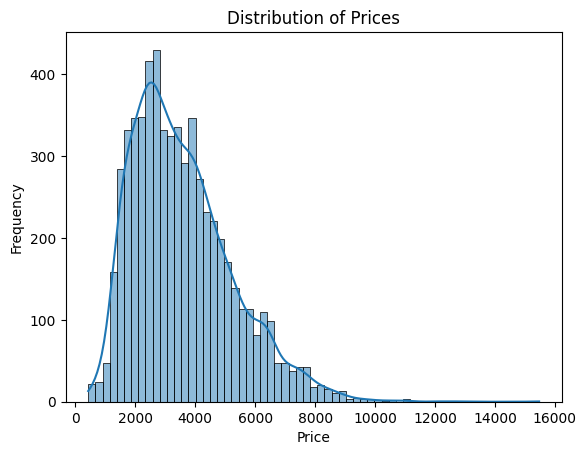

In [ ]:
#price distribution
sns.histplot((df['buynow_price']), kde=True)
plt.title('Distribution of Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()


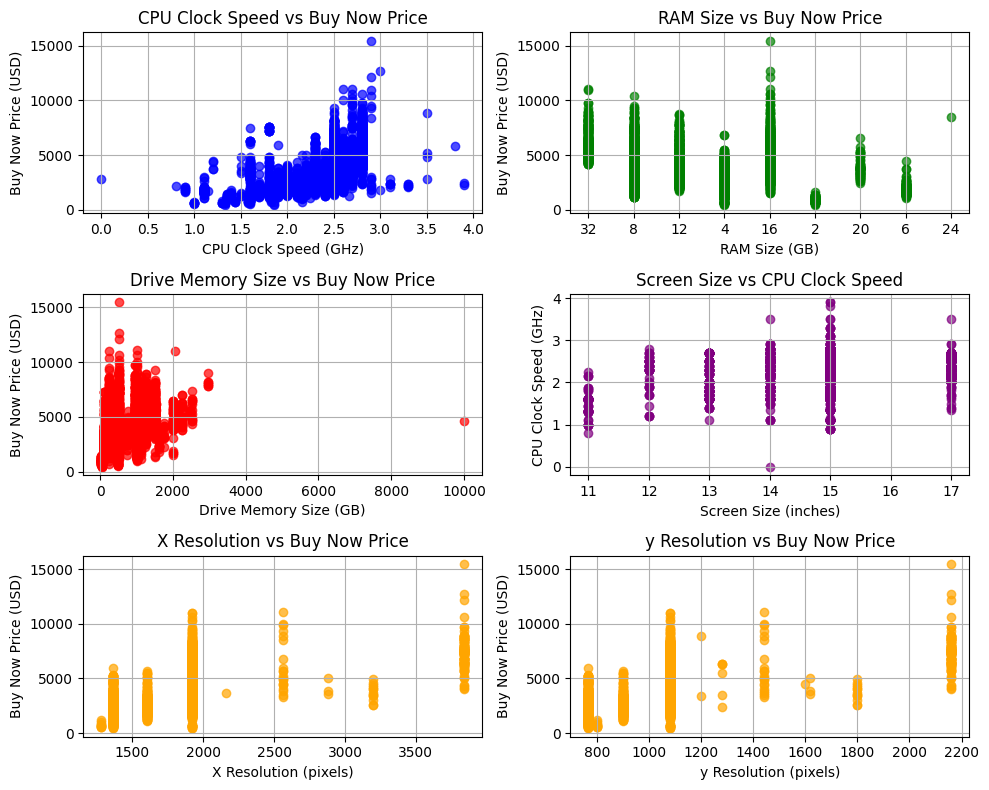

In [ ]:
# Conducting 5 additional visualizations
fig, axs = plt.subplots(3, 2, figsize=(10, 8))

# 1. CPU Clock Speed vs Buy Now Price
axs[0,0].scatter(df["CPU clock speed (GHz)"], df["buynow_price"], c='blue', alpha=0.7)
axs[0,0].set_title('CPU Clock Speed vs Buy Now Price')
axs[0,0].set_xlabel('CPU Clock Speed (GHz)')
axs[0,0].set_ylabel('Buy Now Price (USD)')
axs[0,0].grid(True)

# 2. RAM Size vs Buy Now Price
axs[0,1].scatter(df["RAM size"], df["buynow_price"], c='green', alpha=0.7)
axs[0,1].set_title('RAM Size vs Buy Now Price')
axs[0,1].set_xlabel('RAM Size (GB)')
axs[0,1].set_ylabel('Buy Now Price (USD)')
axs[0,1].grid(True)

# 3. Drive Memory Size vs Buy Now Price
axs[1,0].scatter(df["drive memory size (GB)"], df["buynow_price"], c='red', alpha=0.7)
axs[1,0].set_title('Drive Memory Size vs Buy Now Price')
axs[1,0].set_xlabel('Drive Memory Size (GB)')
axs[1,0].set_ylabel('Buy Now Price (USD)')
axs[1,0].grid(True)

# 4. Screen Size vs CPU Clock Speed
axs[1,1].scatter(df["screen size"].astype('int'), df["CPU clock speed (GHz)"], c='purple', alpha=0.7)
axs[1,1].set_title('Screen Size vs CPU Clock Speed')
axs[1,1].set_xlabel('Screen Size (inches)')
axs[1,1].set_ylabel('CPU Clock Speed (GHz)')
axs[1,1].grid(True)

# 5. Resolution (X) vs Buy Now Price
axs[2,0].scatter(df["x_resolution"], df["buynow_price"], c='orange', alpha=0.7)
axs[2,0].set_title('X Resolution vs Buy Now Price')
axs[2,0].set_xlabel('X Resolution (pixels)')
axs[2,0].set_ylabel('Buy Now Price (USD)')
axs[2,0].grid(True)

# 5. Resolution (Y) vs Buy Now Price
axs[2,1].scatter(df["y_resolution"], df["buynow_price"], c='orange', alpha=0.7)
axs[2,1].set_title('y Resolution vs Buy Now Price')
axs[2,1].set_xlabel('y Resolution (pixels)')
axs[2,1].set_ylabel('Buy Now Price (USD)')
axs[2,1].grid(True)

# Display all plots
plt.tight_layout()
plt.show()


In [ ]:
df.select_dtypes(include=['object'])

,graphic card type,communications,CPU cores,RAM size,operating system,drive type,input devices,multimedia,RAM type,CPU model,warranty
7233,dedicated graphics,"(bluetooth, lan 10/100/1000 mbps)",4,32,"(no system,)",ssd + hdd,"(keyboard, touchpad, illuminated keyboard, num...","(SD card reader, camera, speakers, microphone)",ddr4,intel core i7,producer warranty
5845,dedicated graphics,"(wi-fi, bluetooth, lan 10/100 mbps)",4,8,"(windows 10 home,)",ssd,"(keyboard, touchpad, numeric keyboard)","(SD card reader, camera, speakers, microphone)",ddr3,intel core i7,seller warranty
5897,integrated graphics,"(wi-fi, bluetooth)",4,8,"(windows 10 home,)",ssd,"(keyboard, touchpad, illuminated keyboard)","(SD card reader, camera, speakers, microphone)",ddr4,other CPU,producer warranty
4870,integrated graphics,"(wi-fi, bluetooth, lan 10/100 mbps)",2,8,"(windows 10 home,)",hdd,"(keyboard, touchpad, numeric keyboard)","(SD card reader, camera, speakers, microphone)",ddr4,intel core i3,producer warranty
2498,dedicated graphics,"(wi-fi, bluetooth, lan 10/100/1000 mbps)",4,8,"(windows 8.1 home 64-bit, other)",hdd,"(keyboard, touchpad, illuminated keyboard, num...","(SD card reader, camera, speakers, microphone)",ddr3,intel core i7,producer warranty
...,...,...,...,...,...,...,...,...,...,...,...
5429,dedicated graphics,"(wi-fi, bluetooth, lan 10/100/1000 mbps)",2,8,"(windows 8.1 home 64-bit,)",hdd,"(keyboard, touchpad, numeric keyboard)","(SD card reader, camera, speakers, microphone)",ddr3l,intel core i7,producer warranty
4433,dedicated graphics,"(bluetooth, lan 10/100/1000 mbps, lan 10/100 m...",4,16,"(no system,)",ssd + hdd,"(keyboard, touchpad)","(camera, speakers, microphone)",ddr4,intel core i7,producer warranty
3982,dedicated graphics,"(bluetooth, lan 10/100 mbps)",2,4,"(no system,)",ssd,"(keyboard, touchpad)","(SD card reader, camera, speakers, microphone)",ddr4,intel core i3,producer warranty
9673,dedicated graphics,"(bluetooth, lan 10/100/1000 mbps, lan 10/100 m...",4,16,"(windows 10 home,)",ssd,"(keyboard, touchpad, illuminated keyboard)","(SD card reader, camera, speakers, microphone)",ddr4,intel core i5,producer warranty


In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

# Clean and normalize list-like columns (remove parentheses and split on commas)
columns_to_clean = ['communications', 'operating system', 'input devices', 'multimedia']

for col in columns_to_clean:
    # Convert the column to string type before using .str accessor
    df[col] = df[col].astype(str).str.replace('[()]', '', regex=True).str.split(', ')

# Apply MultiLabelBinarizer to the list-like columns
mlb = MultiLabelBinarizer()

# Encode 'communications'
communications_encoded = pd.DataFrame(mlb.fit_transform(df['communications']), columns=mlb.classes_, index=df.index)

# Encode 'input devices'
input_devices_encoded = pd.DataFrame(mlb.fit_transform(df['input devices']), columns=mlb.classes_, index=df.index)

# Encode 'multimedia'
multimedia_encoded = pd.DataFrame(mlb.fit_transform(df['multimedia']), columns=mlb.classes_, index=df.index)

# Encode 'operating system'
operating_system_encoded = pd.DataFrame(mlb.fit_transform(df['operating system']), columns=mlb.classes_, index=df.index)

# One-Hot Encode columns
columns_to_encode = ['RAM type', 'CPU model', 'warranty', 'graphic card type']

# Initialize OneHotEncoder with sparse_output=False to get a dense array
onehot = OneHotEncoder(sparse_output=False)

# Fit and transform the columns, returning a dense array of 1s and 0s
encoded_columns = onehot.fit_transform(df[columns_to_encode])

# Convert the encoded columns to a DataFrame, ensuring the index matches the original DataFrame
encoded_df = pd.DataFrame(encoded_columns, columns=onehot.get_feature_names_out(columns_to_encode), index=df.index)

# Handle the 'drive type' column considering 'ssd + hdd' as both 'ssd' and 'hdd'

# Define the possible drive types
drive_types = ['ssd', 'hdd', 'emmc', 'hybrid', 'Unknown']

# Create a binary column for each drive type
for drive in drive_types:
    df[drive] = df['drive type'].apply(lambda x: 1 if drive in x else 0)

# Concatenate all encoded columns with the original DataFrame
df_encoded = pd.concat([
    df, communications_encoded, input_devices_encoded, multimedia_encoded,
    operating_system_encoded, encoded_df], axis=1)

# Drop the original list-like columns and columns that were one-hot encoded
columns_to_drop = columns_to_clean + columns_to_encode + ['drive type']
df_encoded = df_encoded.drop(columns=columns_to_drop)
df_encoded



,CPU cores,RAM size,CPU clock speed (GHz),drive memory size (GB),screen size,buynow_price,x_resolution,y_resolution,ssd,hdd,...,CPU model_intel core i5,CPU model_intel core i7,CPU model_intel core m,CPU model_intel pentium dual-core,CPU model_intel pentium quad-core,CPU model_other CPU,warranty_producer warranty,warranty_seller warranty,graphic card type_dedicated graphics,graphic card type_integrated graphics
7233,4,32,2.6,1250.0,17,4999.0,1920,1080,1,1,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
5845,4,8,2.4,256.0,15,2649.0,1366,768,1,0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
5897,4,8,1.2,256.0,12,4499.0,2560,1440,1,0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
4870,2,8,2.0,1000.0,15,2099.0,1366,768,0,1,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2498,4,8,2.4,1000.0,17,2699.0,1920,1080,0,1,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5429,2,8,2.5,1000.0,15,3299.0,1366,768,0,1,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4433,4,16,2.8,1256.0,15,7936.0,3840,2160,1,1,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3982,2,4,2.0,240.0,15,2716.0,1920,1080,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
9673,4,16,2.5,480.0,15,4319.0,1920,1080,1,0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [ ]:
df_encoded = df_encoded.astype(float)

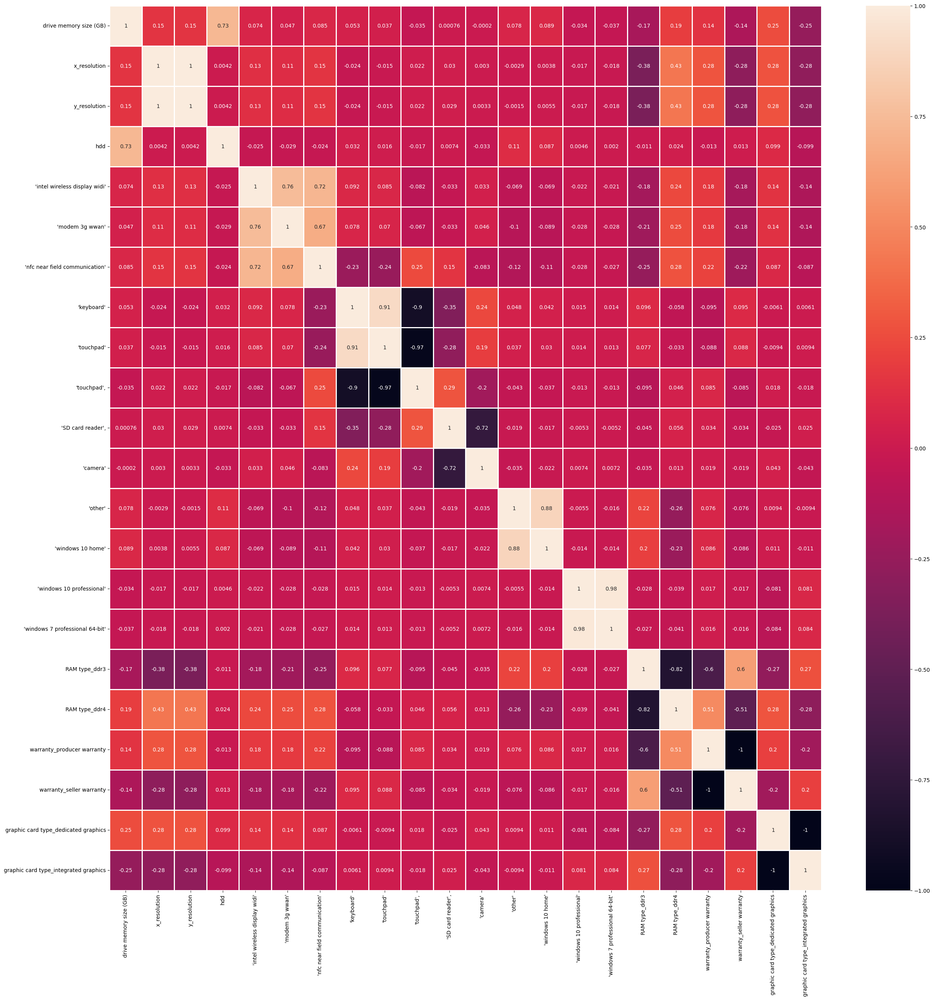

In [ ]:
# Calculate the correlation matrix
corr_matrix = df_encoded.corr()

# Filter for correlations greater than 0.7
high_corr = corr_matrix[abs(corr_matrix) > 0.7]

# Remove diagonal part
high_corr = high_corr.mask(np.equal(*np.indices(high_corr.shape)))

# Get columns with at least one high correlation
cols_to_keep = high_corr.columns[high_corr.notna().any()]

# Display the heatmap with only highly correlated columns
plt.figure(figsize=(30, 30))
sns.heatmap(df_encoded[cols_to_keep].corr(), annot=True, lw=1)
plt.show()


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Function to calculate VIF
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

# Assuming 'df_encoded' is your preprocessed DataFrame with encoded columns
# and 'buynow_price' is your target variable

# Keep the target column separately to add back later
target_column = df_encoded[['buynow_price']].copy()

# Exclude the target variable 'buynow_price' from the feature set for VIF calculation
df_vif = df_encoded.drop(columns=['buynow_price'])

# Calculate VIF for the first time
vif_data = calculate_vif(df_vif)
print("Initial VIF values:\n", vif_data)

# Threshold for VIF, usually anything above 10 is considered high
vif_threshold = 10

# Iteratively remove features with VIF > threshold
while vif_data['VIF'].max() > vif_threshold:
    # Find the feature with the highest VIF
    max_vif_feature = vif_data.loc[vif_data['VIF'].idxmax(), 'feature']

    # Remove the feature with the highest VIF
    print(f'Removing feature {max_vif_feature} with VIF = {vif_data["VIF"].max()}')
    df_vif.drop(columns=[max_vif_feature], inplace=True)

    # Recalculate VIF
    vif_data = calculate_vif(df_vif)
    print(vif_data)

# After removing multicollinear features, add back the 'buynow_price' column
df_encoded_final = pd.concat([df_vif, target_column], axis=1)

# Final DataFrame after VIF reduction, with 'buynow_price' added back
print("Final DataFrame after VIF reduction:\n", df_encoded_final.head())


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Initial VIF values:
                                   feature       VIF
0                               CPU cores  3.902864
1                                RAM size  1.420037
2                   CPU clock speed (GHz)  3.251387
3                  drive memory size (GB)  3.140631
4                             screen size  1.857527
..                                    ...       ...
82                    CPU model_other CPU       inf
83             warranty_producer warranty       inf
84               warranty_seller warranty       inf
85   graphic card type_dedicated graphics       inf
86  graphic card type_integrated graphics       inf

[87 rows x 2 columns]
Removing feature RAM type_ddr3 with VIF = inf


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                                  feature       VIF
0                               CPU cores  3.902864
1                                RAM size  1.420037
2                   CPU clock speed (GHz)  3.251387
3                  drive memory size (GB)  3.140631
4                             screen size  1.857527
..                                    ...       ...
81                    CPU model_other CPU       inf
82             warranty_producer warranty       inf
83               warranty_seller warranty       inf
84   graphic card type_dedicated graphics       inf
85  graphic card type_integrated graphics       inf

[86 rows x 2 columns]
Removing feature CPU model_amd a10 with VIF = inf


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


                                  feature       VIF
0                               CPU cores  3.902864
1                                RAM size  1.420037
2                   CPU clock speed (GHz)  3.251387
3                  drive memory size (GB)  3.140631
4                             screen size  1.857527
..                                    ...       ...
80                    CPU model_other CPU  3.397410
81             warranty_producer warranty       inf
82               warranty_seller warranty       inf
83   graphic card type_dedicated graphics       inf
84  graphic card type_integrated graphics       inf

[85 rows x 2 columns]
Removing feature warranty_producer warranty with VIF = inf


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1782: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss


                                  feature           VIF
0                               CPU cores      3.902864
1                                RAM size      1.420037
2                   CPU clock speed (GHz)      3.251387
3                  drive memory size (GB)      3.140631
4                             screen size      1.857527
..                                    ...           ...
79     CPU model_intel pentium quad-core       5.117266
80                    CPU model_other CPU      3.397410
81               warranty_seller warranty      2.399681
82   graphic card type_dedicated graphics  36863.957275
83  graphic card type_integrated graphics  23033.857089

[84 rows x 2 columns]
Removing feature graphic card type_dedicated graphics with VIF = 36863.95727541034


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   35.777614
1                                RAM size    4.806345
2                   CPU clock speed (GHz)  129.074146
3                  drive memory size (GB)    9.019055
4                             screen size  416.353338
..                                    ...         ...
78      CPU model_intel pentium dual-core   12.154955
79     CPU model_intel pentium quad-core     5.138958
80                    CPU model_other CPU    3.402164
81               warranty_seller warranty    2.862644
82  graphic card type_integrated graphics    3.181190

[83 rows x 2 columns]
Removing feature x_resolution with VIF = 16949.82745691086


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   35.755940
1                                RAM size    4.806064
2                   CPU clock speed (GHz)  129.015312
3                  drive memory size (GB)    9.015551
4                             screen size  414.979363
..                                    ...         ...
77      CPU model_intel pentium dual-core   12.154190
78     CPU model_intel pentium quad-core     5.138958
79                    CPU model_other CPU    3.401506
80               warranty_seller warranty    2.858746
81  graphic card type_integrated graphics    3.180627

[82 rows x 2 columns]
Removing feature 'touchpad' with VIF = 1910.5838568834656


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   35.720108
1                                RAM size    4.805134
2                   CPU clock speed (GHz)  129.015261
3                  drive memory size (GB)    9.012749
4                             screen size  414.887066
..                                    ...         ...
76      CPU model_intel pentium dual-core   12.146955
77     CPU model_intel pentium quad-core     5.137196
78                    CPU model_other CPU    3.400361
79               warranty_seller warranty    2.856747
80  graphic card type_integrated graphics    3.179460

[81 rows x 2 columns]
Removing feature 'windows 10 home', with VIF = 769.6465219377025


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   35.067060
1                                RAM size    4.798846
2                   CPU clock speed (GHz)  120.776905
3                  drive memory size (GB)    8.970948
4                             screen size  331.713038
..                                    ...         ...
75      CPU model_intel pentium dual-core    9.189048
76     CPU model_intel pentium quad-core     3.806868
77                    CPU model_other CPU    2.751551
78               warranty_seller warranty    2.816797
79  graphic card type_integrated graphics    3.073276

[80 rows x 2 columns]
Removing feature screen size with VIF = 331.71303833874066


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   32.940382
1                                RAM size    4.783192
2                   CPU clock speed (GHz)  113.792527
3                  drive memory size (GB)    8.968849
4                            y_resolution   40.688577
..                                    ...         ...
74      CPU model_intel pentium dual-core    7.656699
75     CPU model_intel pentium quad-core     3.442589
76                    CPU model_other CPU    2.647538
77               warranty_seller warranty    2.808057
78  graphic card type_integrated graphics    3.064298

[79 rows x 2 columns]
Removing feature 'camera' with VIF = 197.5927251129327


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   32.385452
1                                RAM size    4.782806
2                   CPU clock speed (GHz)  107.299841
3                  drive memory size (GB)    8.966501
4                            y_resolution   40.140841
..                                    ...         ...
73      CPU model_intel pentium dual-core    6.796738
74     CPU model_intel pentium quad-core     3.072600
75                    CPU model_other CPU    2.494338
76               warranty_seller warranty    2.803941
77  graphic card type_integrated graphics    3.057067

[78 rows x 2 columns]
Removing feature 'keyboard' with VIF = 132.14204697906288


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature         VIF
0                               CPU cores   30.959079
1                                RAM size    4.782465
2                   CPU clock speed (GHz)  103.827468
3                  drive memory size (GB)    8.958242
4                            y_resolution   39.589261
..                                    ...         ...
72      CPU model_intel pentium dual-core    5.808150
73     CPU model_intel pentium quad-core     2.712693
74                    CPU model_other CPU    2.325758
75               warranty_seller warranty    2.794140
76  graphic card type_integrated graphics    3.053309

[77 rows x 2 columns]
Removing feature CPU clock speed (GHz) with VIF = 103.82746836199368


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature        VIF
0                               CPU cores  30.723300
1                                RAM size   4.776013
2                  drive memory size (GB)   8.956490
3                            y_resolution  38.689777
4                                     ssd   8.821679
..                                    ...        ...
71      CPU model_intel pentium dual-core   5.060159
72     CPU model_intel pentium quad-core    2.608500
73                    CPU model_other CPU   2.236091
74               warranty_seller warranty   2.792462
75  graphic card type_integrated graphics   3.046921

[76 rows x 2 columns]
Removing feature 'other' with VIF = 76.34302632957582


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature        VIF
0                               CPU cores  30.696380
1                                RAM size   4.775947
2                  drive memory size (GB)   8.955712
3                            y_resolution  38.680368
4                                     ssd   8.821517
..                                    ...        ...
70      CPU model_intel pentium dual-core   5.060154
71     CPU model_intel pentium quad-core    2.608167
72                    CPU model_other CPU   2.236062
73               warranty_seller warranty   2.778798
74  graphic card type_integrated graphics   3.046738

[75 rows x 2 columns]
Removing feature 'bluetooth' with VIF = 52.27141392846198


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature        VIF
0                               CPU cores  29.952362
1                                RAM size   4.758196
2                  drive memory size (GB)   8.945537
3                            y_resolution  38.550251
4                                     ssd   8.821063
..                                    ...        ...
69      CPU model_intel pentium dual-core   4.509929
70     CPU model_intel pentium quad-core    2.440411
71                    CPU model_other CPU   2.140496
72               warranty_seller warranty   2.778746
73  graphic card type_integrated graphics   3.046053

[74 rows x 2 columns]
Removing feature CPU model_intel core i7 with VIF = 43.738702117406156


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature        VIF
0                               CPU cores  28.308973
1                                RAM size   4.745386
2                  drive memory size (GB)   8.943756
3                            y_resolution  28.190763
4                                     ssd   8.588061
..                                    ...        ...
68      CPU model_intel pentium dual-core   1.545480
69     CPU model_intel pentium quad-core    1.250452
70                    CPU model_other CPU   1.445594
71               warranty_seller warranty   2.762729
72  graphic card type_integrated graphics   3.010518

[73 rows x 2 columns]
Removing feature CPU cores with VIF = 28.308972677007564


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature        VIF
0                                RAM size   4.632231
1                  drive memory size (GB)   8.925919
2                            y_resolution  26.074059
3                                     ssd   8.442378
4                                     hdd   9.017084
..                                    ...        ...
67      CPU model_intel pentium dual-core   1.538958
68     CPU model_intel pentium quad-core    1.178029
69                    CPU model_other CPU   1.423858
70               warranty_seller warranty   2.734739
71  graphic card type_integrated graphics   2.971552

[72 rows x 2 columns]
Removing feature 'windows 7 professional 64-bit' with VIF = 28.271227467778758


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature        VIF
0                                RAM size   4.632220
1                  drive memory size (GB)   8.925346
2                            y_resolution  26.073639
3                                     ssd   8.440489
4                                     hdd   9.016627
..                                    ...        ...
66      CPU model_intel pentium dual-core   1.538952
67     CPU model_intel pentium quad-core    1.178025
68                    CPU model_other CPU   1.423849
69               warranty_seller warranty   2.734736
70  graphic card type_integrated graphics   2.968374

[71 rows x 2 columns]
Removing feature y_resolution with VIF = 26.073638517818498


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature       VIF
0                                RAM size  4.536739
1                  drive memory size (GB)  8.923997
2                                     ssd  8.045599
3                                     hdd  8.905519
4                                    emmc  1.671926
..                                    ...       ...
65      CPU model_intel pentium dual-core  1.537806
66     CPU model_intel pentium quad-core   1.174250
67                    CPU model_other CPU  1.421489
68               warranty_seller warranty  2.732485
69  graphic card type_integrated graphics  2.962250

[70 rows x 2 columns]
Removing feature 'microphone' with VIF = 21.601730002541146


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature       VIF
0                                RAM size  4.529564
1                  drive memory size (GB)  8.891427
2                                     ssd  7.850766
3                                     hdd  8.782510
4                                    emmc  1.665847
..                                    ...       ...
64      CPU model_intel pentium dual-core  1.533520
65     CPU model_intel pentium quad-core   1.163975
66                    CPU model_other CPU  1.419615
67               warranty_seller warranty  2.505378
68  graphic card type_integrated graphics  2.901377

[69 rows x 2 columns]
Removing feature 'speakers' with VIF = 16.248354064228778


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature       VIF
0                                RAM size  4.488908
1                  drive memory size (GB)  8.890614
2                                     ssd  7.565218
3                                     hdd  8.599848
4                                    emmc  1.652462
..                                    ...       ...
63      CPU model_intel pentium dual-core  1.533024
64     CPU model_intel pentium quad-core   1.160676
65                    CPU model_other CPU  1.419531
66               warranty_seller warranty  2.430783
67  graphic card type_integrated graphics  2.854246

[68 rows x 2 columns]
Removing feature 'SD card reader' with VIF = 13.909262623956073


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


                                  feature       VIF
0                                RAM size  4.481932
1                  drive memory size (GB)  8.857609
2                                     ssd  7.166236
3                                     hdd  8.514070
4                                    emmc  1.637265
..                                    ...       ...
62      CPU model_intel pentium dual-core  1.528665
63     CPU model_intel pentium quad-core   1.154428
64                    CPU model_other CPU  1.418653
65               warranty_seller warranty  2.332659
66  graphic card type_integrated graphics  2.827672

[67 rows x 2 columns]
Final DataFrame after VIF reduction:
       RAM size  drive memory size (GB)  ssd  hdd  emmc  hybrid  Unknown  \
7233      32.0                  1250.0  1.0  1.0   0.0     0.0      0.0   
5845       8.0                   256.0  1.0  0.0   0.0     0.0      0.0   
5897       8.0                   256.0  1.0  0.0   0.0     0.0      0.0   
4870       8.0 

In [ ]:
df_encoded_final

,RAM size,drive memory size (GB),ssd,hdd,emmc,hybrid,Unknown,"'bluetooth',",'gps',"'gps',",...,CPU model_intel celeron quad core,CPU model_intel core i3,CPU model_intel core i5,CPU model_intel core m,CPU model_intel pentium dual-core,CPU model_intel pentium quad-core,CPU model_other CPU,warranty_seller warranty,graphic card type_integrated graphics,buynow_price
7233,32.0,1250.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4999.0
5845,8.0,256.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2649.0
5897,8.0,256.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,4499.0
4870,8.0,1000.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2099.0
2498,8.0,1000.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2699.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5429,8.0,1000.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3299.0
4433,16.0,1256.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7936.0
3982,4.0,240.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2716.0
9673,16.0,480.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4319.0


In [ ]:
!pip install catboost
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from catboost import CatBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.3 MB/s eta 0:00:00


In [ ]:
from base64 import standard_b64decode
# use the indeces of given datasets to properly separate it again as initial datasets
train_indeces = train.dropna().index
val_indeces = val.dropna().index
test_indeces = test.dropna().index

train = df_encoded_final.loc[train_indeces]
val = df_encoded_final.loc[val_indeces]
test = df_encoded_final.loc[test_indeces]

selected_features = [col for col in df_encoded_final.columns if col != 'buynow_price']
label_col = 'buynow_price'

X_train, X_val, X_test = train[selected_features].to_numpy(), val[selected_features].to_numpy(), test[selected_features].to_numpy()
y_train, y_val, y_test = df.loc[train_indeces][label_col].to_numpy().ravel(), df.loc[val_indeces][label_col].to_numpy().ravel(), df.loc[test_indeces][label_col].to_numpy().ravel()

scaler = StandardScaler()
y_train = scaler.fit_transform(y_train.reshape(-1, 1))
y_val = scaler.transform(y_val.reshape(-1, 1))
y_test = scaler.transform(y_test.reshape(-1, 1))


In [ ]:
def train_and_evaluate_models(X_train, y_train, X_val, y_val, cv=5):

    # List of models to train
    models = {'LinearRegression': LinearRegression(),
        'Ridge': Ridge(),
        'Lasso': Lasso(),
        'DecisionTreeRegressor': DecisionTreeRegressor(),
        'ExtraTreeRegressor': ExtraTreeRegressor(),
        'RandomForestRegressor': RandomForestRegressor(),
        'GradientBoostingRegressor': GradientBoostingRegressor(),
        'SVR': SVR(),
        'KNeighborsRegressor': KNeighborsRegressor(),
        'XGBRegressor': XGBRegressor(),
        'LGBMRegressor': LGBMRegressor(),
        'CatBoost': CatBoostRegressor()}

    # Dictionary to store model performance
    model_performance = {}

    # Loop through each model, fit it, and evaluate performance on validation data and cross-validation
    for model_name, model in models.items():
        print(f'Training {model_name}...')

        # Train the model on the training set
        model.fit(X_train, y_train)

        # Predictions on validation set
        y_val_pred = model.predict(X_val)

        # Calculate mean squared error and R2 score on validation set
        mse = mean_squared_error(y_val, y_val_pred)
        r2 = r2_score(y_val, y_val_pred)

        # Perform cross-validation
        cv_scores = cross_val_score(model, X_train, y_train, cv=cv, scoring='neg_mean_squared_error')
        mean_cv_mse = -cv_scores.mean()  # Convert negative MSE to positive

        # Store results in the performance dictionary
        model_performance[model_name] = {'Validation R2': r2,
            'Validation MSE': mse,
            'Cross-Validation MSE': mean_cv_mse }

        # Output the performance metrics
        print(f'{model_name} R2 on validation set: {r2:.4f}')
        print(f'{model_name} MSE on validation set: {mse:.4f}')
        print(f'{model_name} Cross-Validation MSE (avg over {cv} folds): {mean_cv_mse:.4f}')
        print('\n')

    return model_performance

performance_results = train_and_evaluate_models(X_train, y_train, X_val, y_val)



Training LinearRegression...
LinearRegression R2 on validation set: 0.7702
LinearRegression MSE on validation set: 0.2298
LinearRegression Cross-Validation MSE (avg over 5 folds): 0.2531


Training Ridge...
Ridge R2 on validation set: 0.7699
Ridge MSE on validation set: 0.2301
Ridge Cross-Validation MSE (avg over 5 folds): 0.2531


Training Lasso...
Lasso R2 on validation set: 0.2958
Lasso MSE on validation set: 0.7042
Lasso Cross-Validation MSE (avg over 5 folds): 0.6904


Training DecisionTreeRegressor...
DecisionTreeRegressor R2 on validation set: 0.7637
DecisionTreeRegressor MSE on validation set: 0.2363
DecisionTreeRegressor Cross-Validation MSE (avg over 5 folds): 0.2286


Training ExtraTreeRegressor...
ExtraTreeRegressor R2 on validation set: 0.7861
ExtraTreeRegressor MSE on validation set: 0.2139
ExtraTreeRegressor Cross-Validation MSE (avg over 5 folds): 0.2249


Training RandomForestRegressor...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example usi

RandomForestRegressor R2 on validation set: 0.8481
RandomForestRegressor MSE on validation set: 0.1519
RandomForestRegressor Cross-Validation MSE (avg over 5 folds): 0.1589


Training GradientBoostingRegressor...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a

GradientBoostingRegressor R2 on validation set: 0.8188
GradientBoostingRegressor MSE on validation set: 0.1812
GradientBoostingRegressor Cross-Validation MSE (avg over 5 folds): 0.2133


Training SVR...


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

SVR R2 on validation set: 0.2187
SVR MSE on validation set: 0.7813
SVR Cross-Validation MSE (avg over 5 folds): 0.7924


Training KNeighborsRegressor...
KNeighborsRegressor R2 on validation set: 0.7581
KNeighborsRegressor MSE on validation set: 0.2419
KNeighborsRegressor Cross-Validation MSE (avg over 5 folds): 0.2724


Training XGBRegressor...
XGBRegressor R2 on validation set: 0.8649
XGBRegressor MSE on validation set: 0.1351
XGBRegressor Cross-Validation MSE (avg over 5 folds): 0.1451


Training LGBMRegressor...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010595 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 3694, number of used features: 41
[LightGBM] [Info] Start training from score -0.000000


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 115
[LightGBM] [Info] Number of data points in the train set: 2955, number of used features: 37
[LightGBM] [Info] Start training from score 0.001699
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001001 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 2955, number of used features: 38
[LightGBM] [Info] Start training from score -0.007029


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 120
[LightGBM] [Info] Number of data points in the train set: 2955, number of used features: 39
[LightGBM] [Info] Start training from score -0.002442


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 2955, number of used features: 39
[LightGBM] [Info] Start training from score 0.009178


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Streaming output truncated to the last 5000 lines.
9:	learn: 0.7792202	total: 46.1ms	remaining: 4.56s
10:	learn: 0.7629519	total: 54.4ms	remaining: 4.89s
11:	learn: 0.7498960	total: 56.3ms	remaining: 4.64s
12:	learn: 0.7344756	total: 58.3ms	remaining: 4.42s
13:	learn: 0.7207772	total: 60.2ms	remaining: 4.24s
14:	learn: 0.7089967	total: 62.9ms	remaining: 4.13s
15:	learn: 0.6960479	total: 65.3ms	remaining: 4.02s
16:	learn: 0.6836850	total: 68ms	remaining: 3.93s
17:	learn: 0.6715295	total: 73.4ms	remaining: 4s
18:	learn: 0.6609114	total: 75.8ms	remaining: 3.91s
19:	learn: 0.6503021	total: 81.4ms	remaining: 3.99s
20:	learn: 0.6406084	total: 84.5ms	remaining: 3.94s
21:	learn: 0.6303186	total: 102ms	remaining: 4.52s
22:	learn: 0.6220541	total: 104ms	remaining: 4.43s
23:	learn: 0.6130364	total: 108ms	remaining: 4.41s
24:	learn: 0.6049611	total: 120ms	remaining: 4.68s
25:	learn: 0.5970334	total: 122ms	remaining: 4.57s
26:	learn: 0.5902502	total: 125ms	remaining: 4.49s
27:	learn: 0.5823743	tota



Training LinearRegression...
LinearRegression R2 on validation set: 0.7440
LinearRegression MSE on validation set: 0.2560
LinearRegression Cross-Validation MSE (avg over 5 folds): 0.2473


Training Ridge...
Ridge R2 on validation set: 0.7446
Ridge MSE on validation set: 0.2554
Ridge Cross-Validation MSE (avg over 5 folds): 0.2471


Training Lasso...
Lasso R2 on validation set: 0.3175
Lasso MSE on validation set: 0.6825
Lasso Cross-Validation MSE (avg over 5 folds): 0.6944


Training DecisionTreeRegressor...
DecisionTreeRegressor R2 on validation set: 0.8142
DecisionTreeRegressor MSE on validation set: 0.1858
DecisionTreeRegressor Cross-Validation MSE (avg over 5 folds): 0.2139


Training ExtraTreeRegressor...
ExtraTreeRegressor R2 on validation set: 0.8148
ExtraTreeRegressor MSE on validation set: 0.1852
ExtraTreeRegressor Cross-Validation MSE (avg over 5 folds): 0.2182


Training RandomForestRegressor...


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example usi

RandomForestRegressor R2 on validation set: 0.8636
RandomForestRegressor MSE on validation set: 0.1364
RandomForestRegressor Cross-Validation MSE (avg over 5 folds): 0.1500


Training GradientBoostingRegressor...


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a

GradientBoostingRegressor R2 on validation set: 0.8078
GradientBoostingRegressor MSE on validation set: 0.1922
GradientBoostingRegressor Cross-Validation MSE (avg over 5 folds): 0.2057


Training SVR...


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

SVR R2 on validation set: 0.2580
SVR MSE on validation set: 0.7420
SVR Cross-Validation MSE (avg over 5 folds): 0.7754


Training KNeighborsRegressor...
KNeighborsRegressor R2 on validation set: 0.7822
KNeighborsRegressor MSE on validation set: 0.2178
KNeighborsRegressor Cross-Validation MSE (avg over 5 folds): 0.2500


Training XGBRegressor...
XGBRegressor R2 on validation set: 0.8701
XGBRegressor MSE on validation set: 0.1299
XGBRegressor Cross-Validation MSE (avg over 5 folds): 0.1435


Training LGBMRegressor...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001591 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 4909, number of used features: 43
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of 

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001332 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 125
[LightGBM] [Info] Number of data points in the train set: 3927, number of used features: 41
[LightGBM] [Info] Start training from score -0.007145
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001610 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 126
[LightGBM] [Info] Number of data points in the train set: 3927, number of used features: 42
[LightGBM] [Info] Start training from score 0.004642


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Streaming output truncated to the last 5000 lines.
9:	learn: 0.7637349	total: 22.3ms	remaining: 2.2s
10:	learn: 0.7459881	total: 24.2ms	remaining: 2.17s
11:	learn: 0.7312503	total: 26.1ms	remaining: 2.15s
12:	learn: 0.7164586	total: 28.1ms	remaining: 2.13s
13:	learn: 0.7008076	total: 30.1ms	remaining: 2.12s
14:	learn: 0.6874445	total: 32.2ms	remaining: 2.12s
15:	learn: 0.6743651	total: 35.7ms	remaining: 2.19s
16:	learn: 0.6609609	total: 37.6ms	remaining: 2.18s
17:	learn: 0.6483760	total: 39.7ms	remaining: 2.16s
18:	learn: 0.6366770	total: 41.6ms	remaining: 2.15s
19:	learn: 0.6262132	total: 43.6ms	remaining: 2.13s
20:	learn: 0.6163830	total: 45.5ms	remaining: 2.12s
21:	learn: 0.6068533	total: 47.3ms	remaining: 2.1s
22:	learn: 0.5972652	total: 49.2ms	remaining: 2.09s
23:	learn: 0.5883271	total: 51.1ms	remaining: 2.08s
24:	learn: 0.5808063	total: 52.9ms	remaining: 2.06s
25:	learn: 0.5742349	total: 54.8ms	remaining: 2.05s
26:	learn: 0.5675026	total: 56.8ms	remaining: 2.04s
27:	learn: 0.560

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_gb.py:668: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape o

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 130
[LightGBM] [Info] Number of data points in the train set: 4909, number of used features: 43
[LightGBM] [Info] Start training from score -0.000000
Learning rate set to 0.052645
0:	learn: 0.9707349	total: 2.45ms	remaining: 2.45s
1:	learn: 0.9399150	total: 4.64ms	remaining: 2.32s
2:	learn: 0.9123746	total: 6.69ms	remaining: 2.22s
3:	learn: 0.8858155	total: 9ms	remaining: 2.24s
4:	learn: 0.8592577	total: 11ms	remaining: 2.19s
5:	learn: 0.8353524	total: 13.2ms	remaining: 2.19s
6:	learn: 0.8120726	total: 15.6ms	remaining: 2.21s
7:	learn: 0.7920763	total: 17.8ms	remaining: 2.2s
8:	learn: 0.7737447	total: 19.8ms	remaining: 2.18s
9:	learn: 0.7545048	total: 21.9ms	remaining: 2.17s
10:	learn: 0.7347839	total: 23.9ms	remaining: 2.15s
11:	learn

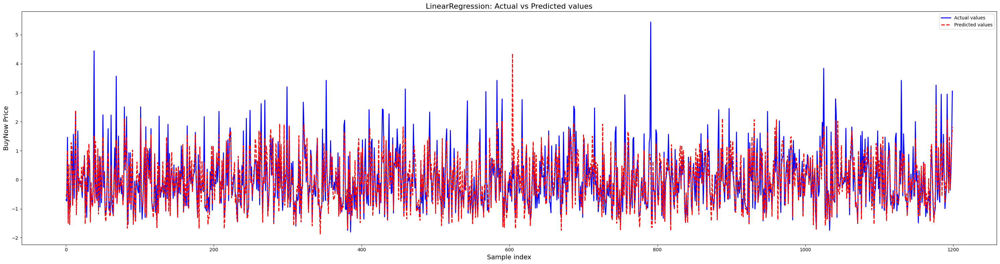

Evaluating Ridge on the test set...


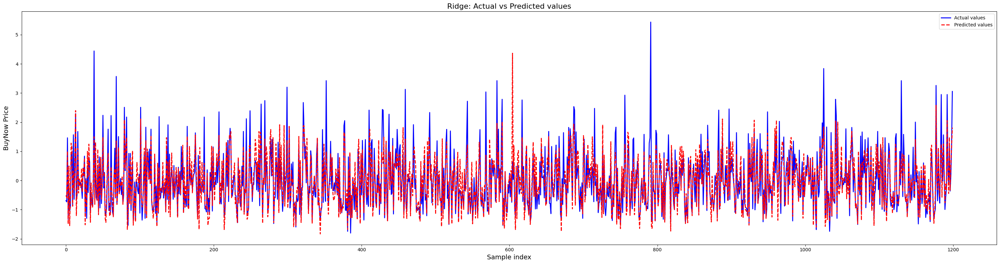

Evaluating Lasso on the test set...


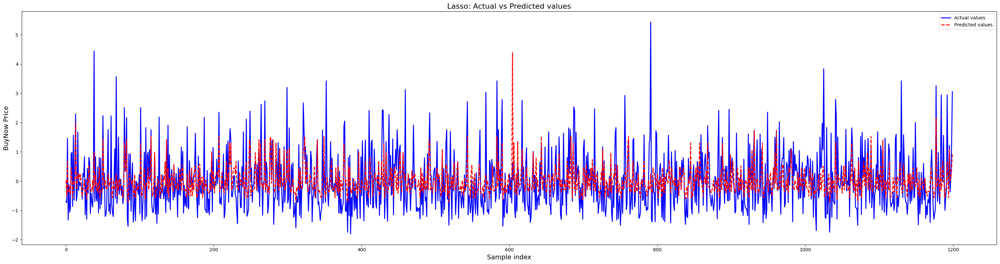

Evaluating DecisionTreeRegressor on the test set...


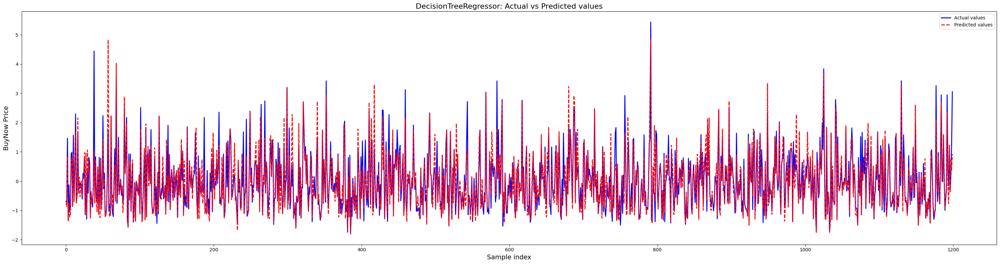

Evaluating ExtraTreeRegressor on the test set...


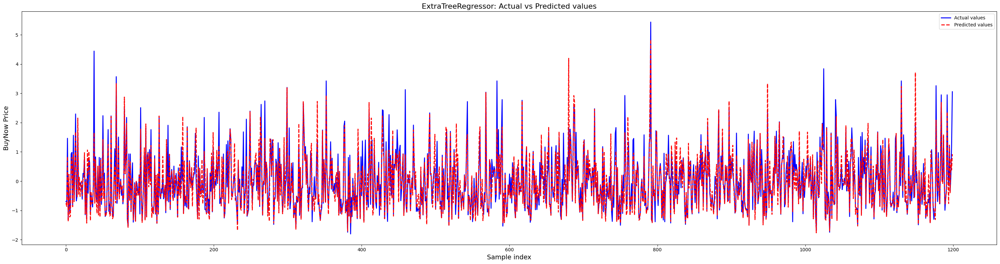

Evaluating RandomForestRegressor on the test set...


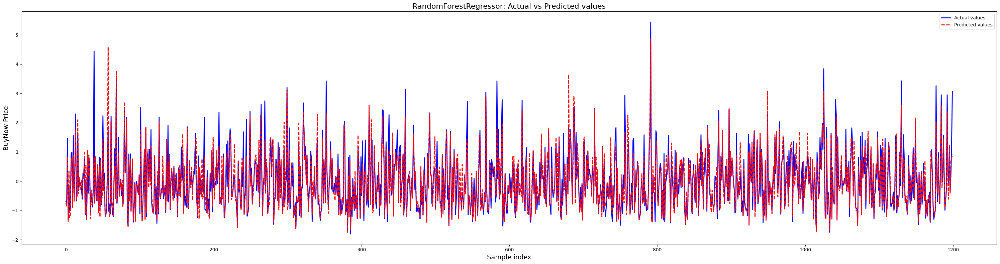

Evaluating GradientBoostingRegressor on the test set...


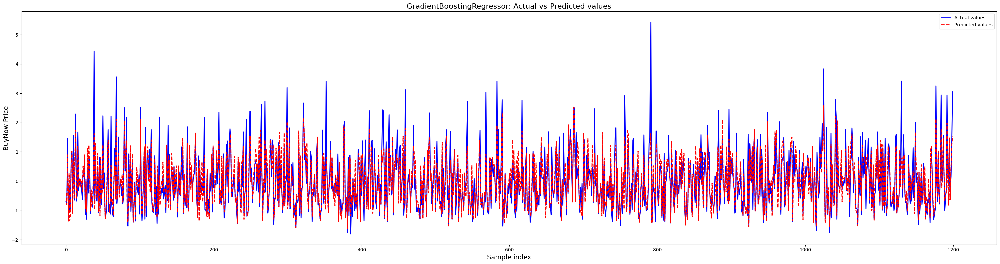

Evaluating SVR on the test set...


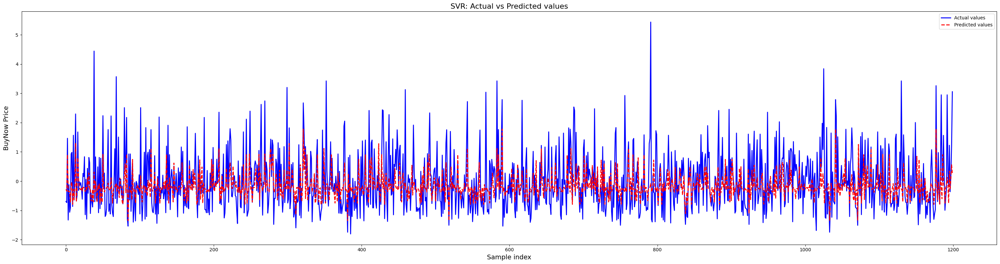

Evaluating KNeighborsRegressor on the test set...


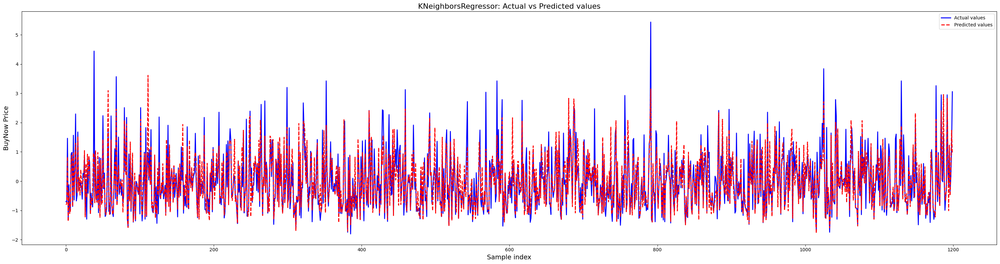

Evaluating XGBRegressor on the test set...


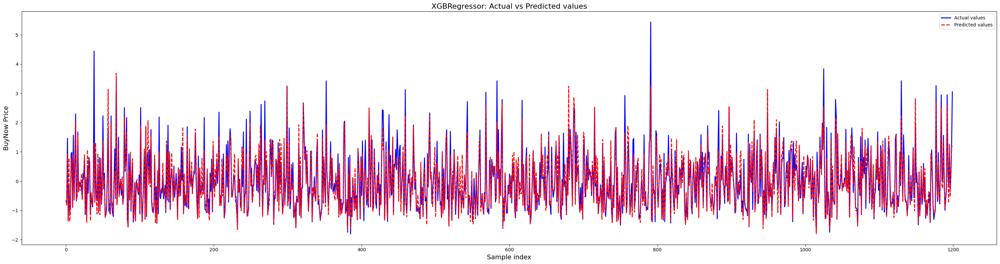

Evaluating LGBMRegressor on the test set...


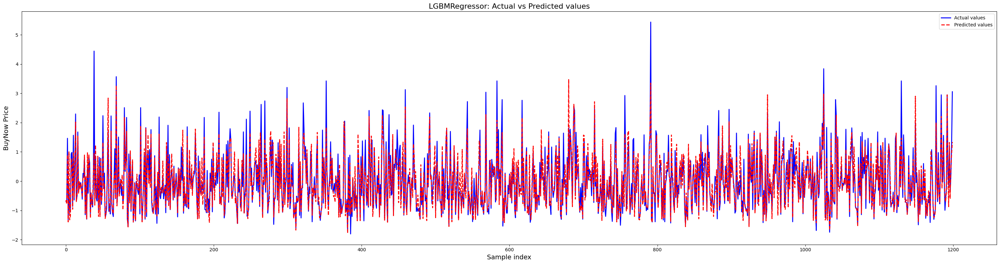

Evaluating CatBoost on the test set...


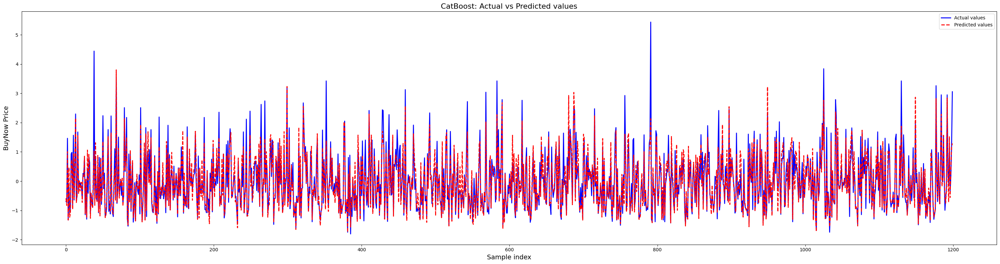

Model performance on test set:
LinearRegression: 0.2560
Ridge: 0.2554
Lasso: 0.6825
DecisionTreeRegressor: 0.1869
ExtraTreeRegressor: 0.1686
RandomForestRegressor: 0.1388
GradientBoostingRegressor: 0.1923
SVR: 0.7420
KNeighborsRegressor: 0.2178
XGBRegressor: 0.1299
LGBMRegressor: 0.1371
CatBoost: 0.1329


In [ ]:
# Combine training and validation data
X_train_combined = np.concatenate((X_train, X_val), axis=0)
y_train_combined = np.concatenate((y_train, y_val), axis=0)

def evaluate_on_test(models, X_test, y_test):
    # Dictionary to store the performance on the test set
    test_performance = {}

    # Loop through each trained model and evaluate on the test set
    for model_name, model in models.items():
        print(f'Evaluating {model_name} on the test set...')
        y_test_pred = model.predict(X_test)

        # Calculate mean squared error on the test set
        mse_test = mean_squared_error(y_test, y_test_pred)
        test_performance[model_name] = mse_test

        # Plot predictions vs actual for each model
        plot_predictions_vs_actual(y_test, y_test_pred, model_name)

    return test_performance

print('\n')

def plot_predictions_vs_actual(y_test, y_pred, model_name):
    plt.figure(figsize=(30, 8))

    # Plot actual vs predicted values
    plt.plot(y_test, label='Actual values', color='blue', linewidth=2)
    plt.plot(y_pred, label='Predicted values', color='red', linestyle='dashed', linewidth=2)

    # Add plot labels and title
    plt.title(f'{model_name}: Actual vs Predicted values', fontsize=16)
    plt.xlabel('Sample index', fontsize=14)
    plt.ylabel('BuyNow Price', fontsize=14)

    # Add legend
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()

# Example of usage:
# First, train and evaluate the models on the validation set:
performance_results = train_and_evaluate_models(X_train_combined, y_train_combined, X_test, y_test)

# Now, pass the trained models and test data to the evaluation function
test_performance_results = evaluate_on_test(models={
    'LinearRegression': LinearRegression().fit(X_train_combined, y_train_combined),
    'Ridge': Ridge().fit(X_train_combined, y_train_combined),
    'Lasso': Lasso().fit(X_train_combined, y_train_combined),
    'DecisionTreeRegressor': DecisionTreeRegressor().fit(X_train_combined, y_train_combined),
    'ExtraTreeRegressor': ExtraTreeRegressor().fit(X_train_combined, y_train_combined),
    'RandomForestRegressor': RandomForestRegressor().fit(X_train_combined, y_train_combined),
    'GradientBoostingRegressor': GradientBoostingRegressor().fit(X_train_combined, y_train_combined),
    'SVR': SVR().fit(X_train_combined, y_train_combined),
    'KNeighborsRegressor': KNeighborsRegressor().fit(X_train_combined, y_train_combined),
    'XGBRegressor': XGBRegressor().fit(X_train_combined, y_train_combined),
    'LGBMRegressor': LGBMRegressor().fit(X_train_combined, y_train_combined),
    'CatBoost': CatBoostRegressor().fit(X_train_combined, y_train_combined)}, X_test=X_test, y_test=y_test)

# Print test performance results
print("Model performance on test set:")
for model, mse in test_performance_results.items():
    print(f"{model}: {mse:.4f}")


In [ ]:
#Deep Learning is not needed since the data is not big enough to generate pattern and insight for further training

In [ ]:
import statsmodels.api as sm

def bidirectional_feature_selection(x, y, significance_threshold=0.05):
    selected_features = set(x.columns)  # Starts with all features

    while True:
        # Convert selected_features to a list before indexing
        model = sm.OLS(y, sm.add_constant(x[list(selected_features)])).fit()
        p_values = model.pvalues.iloc[1:]
        significant_features = p_values[p_values < significance_threshold].index

        if len(significant_features) == len(selected_features):
            break

        # Convert selected_features to a list before indexing
        model = sm.OLS(y, sm.add_constant(x[list(significant_features)])).fit()
        non_significant_features = p_values[p_values >= significance_threshold].index
        for feature in non_significant_features:
            selected_features.remove(feature)

    return selected_features

x = df_encoded_final.drop('buynow_price', axis=1)
y = df_encoded_final['buynow_price']

selected_features = bidirectional_feature_selection(x,y)
selected_features


{"'illuminated keyboard'",
 "'intel wireless display widi'",
 "'lan 10/100/1000 mbps'",
 "'lan 10/100/1000 mbps',",
 "'modem 3g wwan'",
 "'modem 4g lte'",
 "'numeric keyboard'",
 "'other',",
 "'wi-fi 802.11 a/b/g/n/ac'",
 "'wi-fi 802.11 b/g/n/ac'",
 "'wi-fi'",
 "'windows 10 home'",
 "'windows 10 professional',",
 "'windows 7 professional 64-bit',",
 "'windows 8.1 home 64-bit',",
 'CPU model_amd a12',
 'CPU model_amd a4',
 'CPU model_amd a6',
 'CPU model_amd a8',
 'CPU model_amd e1',
 'CPU model_intel celeron ',
 'CPU model_intel celeron dual-core',
 'CPU model_intel celeron m',
 'CPU model_intel celeron quad core ',
 'CPU model_intel core i3',
 'CPU model_intel core i5',
 'CPU model_intel core m',
 'CPU model_intel pentium dual-core',
 'CPU model_intel pentium quad-core ',
 'CPU model_other CPU',
 'RAM size',
 'RAM type_ddr4',
 'drive memory size (GB)',
 'emmc',
 'graphic card type_integrated graphics',
 'hdd',
 'hybrid',
 'ssd',
 'warranty_seller warranty'}

In [ ]:
X_train2, X_val2, X_test2 = train[list(selected_features)].to_numpy(), val[list(selected_features)].to_numpy(), test[list(selected_features)].to_numpy()
y_train, y_val, y_test = train['buynow_price'].to_numpy(), val['buynow_price'].to_numpy(), test['buynow_price'].to_numpy()

# Normalize the data
scaler = StandardScaler()
y_train = scaler.fit_transform(y_train.reshape(-1, 1))
y_val = scaler.fit_transform(y_val.reshape(-1, 1))
y_test = scaler.fit_transform(y_test.reshape(-1, 1))

# Combine training and validation data
X_train_combined = np.concatenate((X_train2, X_val2), axis=0)
y_train_combined = np.concatenate((y_train, y_val), axis=0)

# Fit the model with the combined data
xgb = XGBRegressor()
xgb.fit(X_train_combined, y_train_combined)

# Predict and evaluate as before
y_pred = xgb.predict(X_test2)
mse = mean_squared_error(y_test, y_pred)
print("MSE:", mse)
print("R2:", r2_score(y_test, y_pred))


MSE: 0.12990791699743406
R2: 0.8700920830025659


In [ ]:
#result slightly decrease and almost the same, therefore no need for removing features


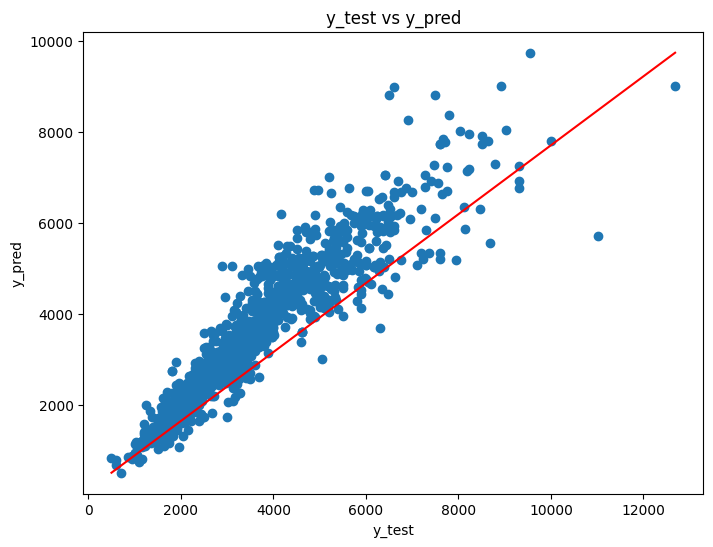

In [ ]:
y_test_original = scaler.inverse_transform(y_test.reshape(-1, 1))
y_pred_original = scaler.inverse_transform(y_pred.reshape(-1, 1))

plt.figure(figsize=(8, 6))
plt.scatter(y_test_original, y_pred_original)
plt.plot([min(y_test_original), max(y_test_original)],
 [min(y_pred_original), max(y_pred_original)], color='red')
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.title("y_test vs y_pred")
plt.show()


Feature: RAM size, Score: 0.028467874974012375
Feature: drive memory size (GB), Score: 0.007394683547317982
Feature: ssd, Score: 0.02834337204694748
Feature: hdd, Score: 0.030897818505764008
Feature: emmc, Score: 0.00017756134911905974
Feature: hybrid, Score: 0.0007910360582172871
Feature: Unknown, Score: 0.0
Feature: 'bluetooth',, Score: 0.003105893498286605
Feature: 'gps', Score: 0.012040311470627785
Feature: 'gps',, Score: 0.0
Feature: 'intel wireless display widi', Score: 0.0069341217167675495
Feature: 'intel wireless display widi',, Score: 0.0016281857388094068
Feature: 'lan 10/100 mbps', Score: 0.026534201577305794
Feature: 'lan 10/100/1000 mbps', Score: 0.007783736102283001
Feature: 'lan 10/100/1000 mbps',, Score: 0.0034414175897836685
Feature: 'modem 3g wwan', Score: 0.008961773477494717
Feature: 'modem 4g lte', Score: 0.01683186925947666
Feature: 'nfc near field communication', Score: 0.004935096949338913
Feature: 'nfc near field communication',, Score: 0.0006772109773010015
F

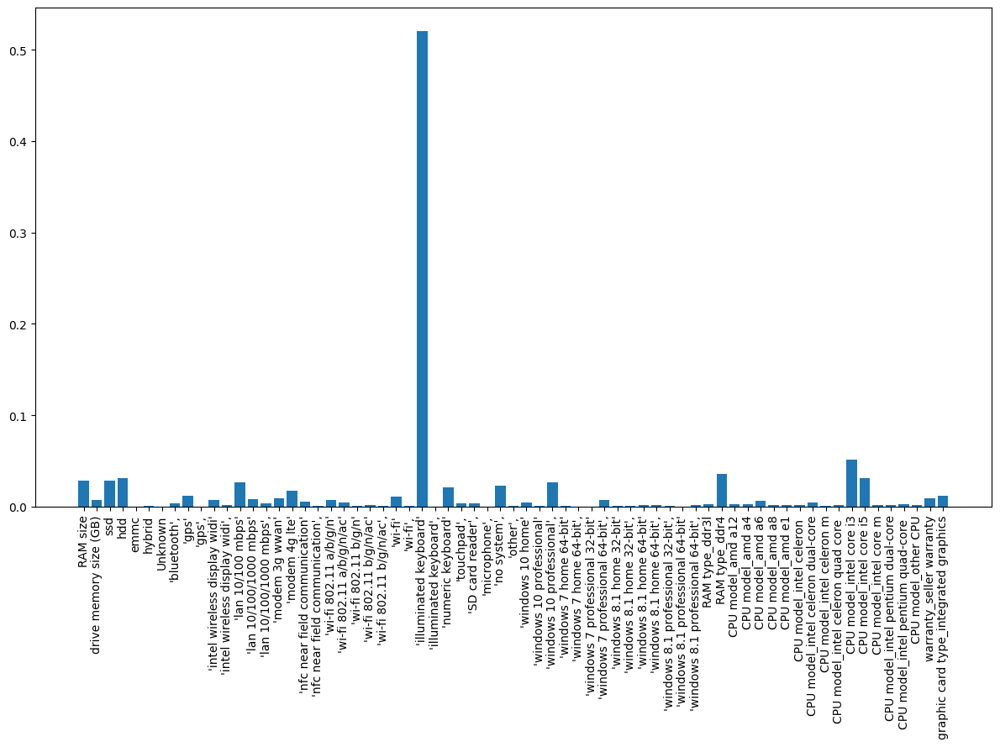

In [ ]:
# get importance
importance = xgb.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print(f"Feature: {list(selected_features)[i]}, Score: {v}") # Convert set to list using list()
# plot feature importance
plt.figure(figsize=(12, 9))
plt.bar(list(selected_features), importance)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()
